# Parking Space Detection
Cloning M-RCNN repository

In [1]:
import numpy as np
import cv2
from pathlib import Path
from google.colab.patches import cv2_imshow
import pickle

from shapely.geometry import box
from shapely.geometry import Polygon as shapely_poly
from IPython.display import clear_output, Image, display, HTML
import io
import base64
%matplotlib inline
%tensorflow_version 1.x

TensorFlow 1.x selected.


### Importing required modules

In [2]:
!git clone https://github.com/matterport/Mask_RCNN

import os
os.chdir("Mask_RCNN/")
import mrcnn.config
import mrcnn.utils
from mrcnn.model import MaskRCNN

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 116.76 MiB | 15.75 MiB/s, done.
Resolving deltas: 100% (566/566), done.


Using TensorFlow backend.


### Configuring M-RCNN

In [3]:
class Config(mrcnn.config.Config):
    NAME = "coco_pretrained_model_config"
    IMAGES_PER_GPU = 1
    GPU_COUNT = 1
    NUM_CLASSES = 81

config = Config()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [4]:
ROOT_DIR = Path(".")
MODEL_DIR = os.path.join(ROOT_DIR, "logs")
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

### Download pre-trained Model

In [5]:
if not os.path.exists(COCO_MODEL_PATH):
    mrcnn.utils.download_trained_weights(COCO_MODEL_PATH)

... done downloading pretrained model!


# Loading pre-trained model 

In [6]:
model = MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=Config())

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [7]:
model.load_weights(COCO_MODEL_PATH, by_name=True)

#### Create data directory

In [8]:
#  This will contain test videos and images
if not os.path.exists("./data"):
    os.makedirs("./data")

### Uploading data
upload your video file and praking regions file using the sidebar.

In [9]:
VIDEO_SOURCE = "/content/Mask_RCNN/data/parking4.mp4"
PARKING_REGIONS = "/content/Mask_RCNN/data/regions.p"
with open(PARKING_REGIONS, 'rb') as f:
    parked_car_boxes = pickle.load(f)

### Function to filter out car boxes

In [ ]:
# COCO predefined classes

class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [10]:
def get_car_boxes(boxes, class_ids):
    car_boxes = []

    for i, box in enumerate(boxes):
        # If the detected object isn't a car / bus / truck, skip it
        if class_ids[i] in [3, 8, 6]:
            car_boxes.append(box)

    return np.array(car_boxes)

### Function to compute IoU

In [11]:
def compute_overlaps(parked_car_boxes, car_boxes):
    
    new_car_boxes = []
    for box in car_boxes:
        y1 = box[0]
        x1 = box[1]
        y2 = box[2]
        x2 = box[3]
        
        p1 = (x1, y1)
        p2 = (x2, y1)
        p3 = (x2, y2)
        p4 = (x1, y2)
        new_car_boxes.append([p1, p2, p3, p4])
    
    overlaps = np.zeros((len(parked_car_boxes), len(new_car_boxes)))
    for i in range(len(parked_car_boxes)):
        for j in range(car_boxes.shape[0]):
            pol1_xy = parked_car_boxes[i]
            pol2_xy = new_car_boxes[j]
            polygon1_shape = shapely_poly(pol1_xy)
            polygon2_shape = shapely_poly(pol2_xy)

            polygon_intersection = polygon1_shape.intersection(polygon2_shape).area
            polygon_union = polygon1_shape.union(polygon2_shape).area
            IOU = polygon_intersection / polygon_union
            overlaps[i][j] = IOU

    return overlaps

### Function to display processed images

In [12]:
def arrayShow (imageArray):
    ret, png = cv2.imencode('.png', imageArray)
    encoded = base64.b64encode(png)
    return Image(data=encoded.decode('ascii'))

### Putting it all together

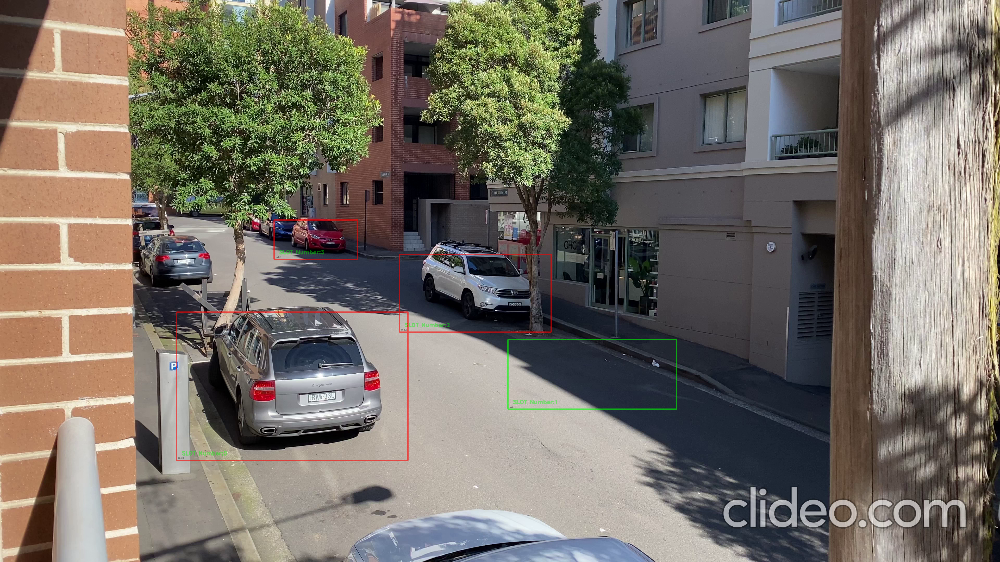

In [ ]:
alpha = 0.6
video_capture = cv2.VideoCapture(VIDEO_SOURCE)
cnt=0

video_FourCC    = cv2.VideoWriter_fourcc('M','J','P','G')
video_fps       = video_capture.get(cv2.CAP_PROP_FPS)
video_size      = (int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH)),
                    int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT)))
out = cv2.VideoWriter("out.avi", video_FourCC, video_fps, video_size)

while video_capture.isOpened():
    success, frame = video_capture.read()
    overlay = frame.copy()
    if not success:
        break

    rgb_image = frame[:, :, ::-1]
    results = model.detect([rgb_image], verbose=0)

    car_boxes = get_car_boxes(results[0]['rois'], results[0]['class_ids'])
    overlaps = compute_overlaps(parked_car_boxes, car_boxes)

    slot = []
    font = cv2.FONT_HERSHEY_DUPLEX 
    number = 0

    for parking_area, overlap_areas in zip(parked_car_boxes, overlaps):
      
      x1, y1 = parking_area[0]
      x2, y2 = parking_area[1]
      x3, y3 = parking_area[2]
      x4, y4 = parking_area[3]

      fx1 = min(x1,x2,x3,x4)
      fx2 = max(x1,x2,x3,x4)
      fy1 = min(y1,y2,y3,y4)
      fy2 = max(y1,y2,y3,y4)
      
      #print(parking_area.shape[0])

      max_IoU_overlap = np.max(overlap_areas)
      if max_IoU_overlap < 0.15:
        cv2.rectangle(overlay, (fx1, fy1), (fx2, fy2), (0, 255, 0), 3)
        cv2.putText(frame, "SLOT Number:" + str(number), (fx1 + 20, fy2 - 20), font, 0.7, (0, 255, 0), 2, cv2.FILLED)
        number = number + 1  
        #free_space = True
        slot.append(1) 
      else:
        cv2.rectangle(overlay, (fx1, fy1), (fx2, fy2), (0, 0, 255), 3)
        cv2.putText(frame, "SLOT Number:" + str(number), (fx1 + 20, fy2 - 20), font, 0.7, (0, 255, 0), 2, cv2.FILLED)
        number = number + 1 
        slot.append(0)  
      cv2.putText(frame, f"{max_IoU_overlap:0.2}", (fx1 + 6, fy2 - 6), font, 0.3, (0, 0, 0))  
    
    for i in range(0,len(slot)):
      if slot[i] == 1:
        print(i, "FREE")
      else:
        print(i, "NOT FREE")

    cv2.addWeighted(overlay, alpha, frame, 1 - alpha, 0, frame)

    out.write(frame)

    clear_output(wait=True)
    img = arrayShow(frame)
    display(img)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

video_capture.release()
out.release()
cv2.destroyAllWindows()